In [1]:
# Copyright (C) 2022 Intel Corporationworkbench.action.openLargeOutput
#
# SPDX-License-Identifier: MIT

import os
import datumaro as dm
import time
import random

from datumaro.components.searcher import Searcher
from datumaro.components.visualizer import Visualizer

## malaria

In [2]:
start_time = time.time()
malaria_dataset = dm.Dataset.import_from("/media/hdd2/datumaro/clf_data/malaria/train", format="imagenet")
print(f'setting dataset time for {len(malaria_dataset)} items: ', time.time()-start_time)
malaria_dataset

13778it [00:00, 21469.32it/s]

setting dataset time for 13778 items:  1.095776081085205


Dataset
	size=13778
	source_path=/media/hdd2/datumaro/clf_data/malaria/train
	media_type=<class 'datumaro.components.media.Image'>
	annotated_items_count=13778
	annotations_count=13778
subsets
	default: # of items=13778, # of annotated items=13778, # of annotations=13778, annotation types=['label']
infos
	categories
	label: ['Parasitized', 'Uninfected']

In [3]:
malaria_visualizer = Visualizer(malaria_dataset, figsize=(50, 50), alpha=0)
start_time = time.time()
malaria_searcher = Searcher(malaria_dataset)
print(f'setting dataset time for {len(malaria_dataset)} items: ', time.time()-start_time)

setting dataset time for 13778 items:  1139.4314222335815


In [4]:
for i, item in enumerate(malaria_dataset):
    if i==52:
        query = item

### Random result

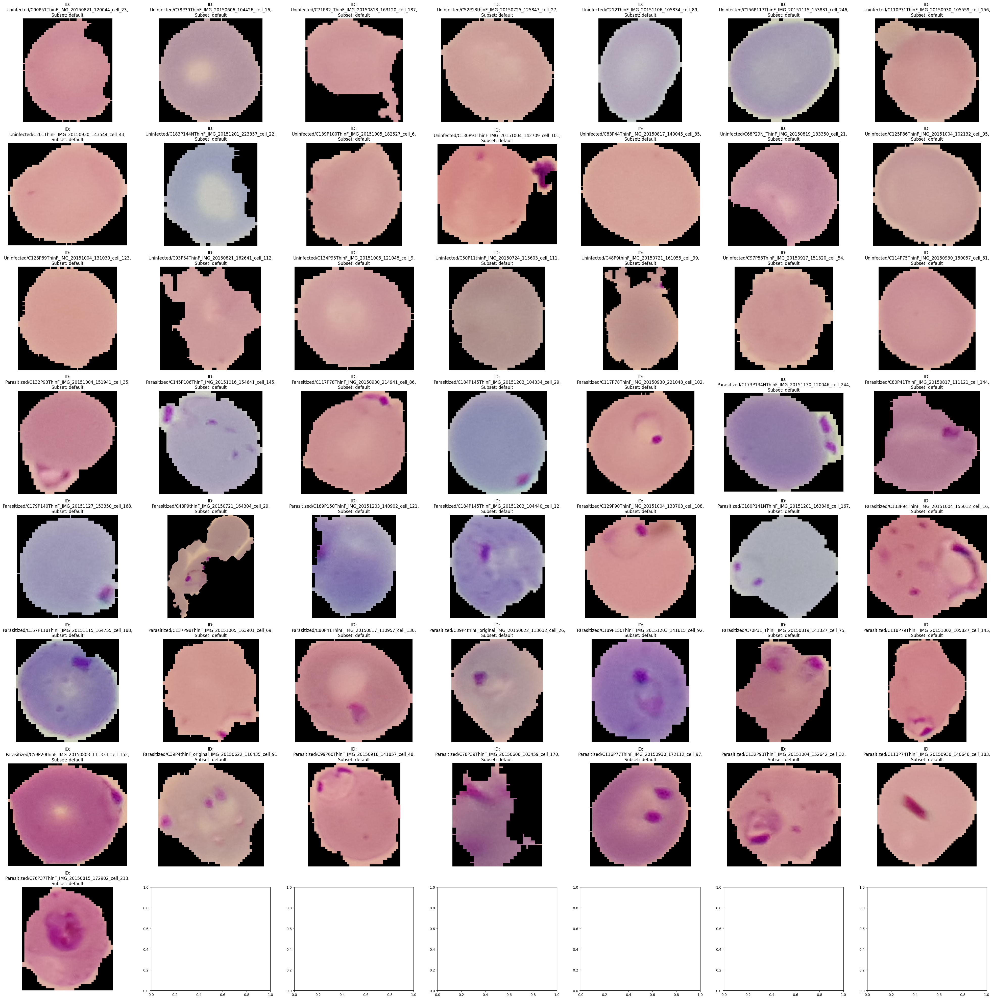

In [5]:
random_choices = random.choices(range(len(malaria_dataset)), k=49)
random_results = []
for i, item in enumerate(malaria_dataset):
    if i in random_choices:
        random_results.append(item)
random_results = [query] + random_results
subset_list = []
id_list =[]
for result in random_results:
    subset_list.append(result.subset)
    id_list.append(result.id)
fig = malaria_visualizer.vis_gallery(id_list, subset_list, (None, None))
fig.show()

### Search result with `image` query

search time for top50:  0.047147274017333984


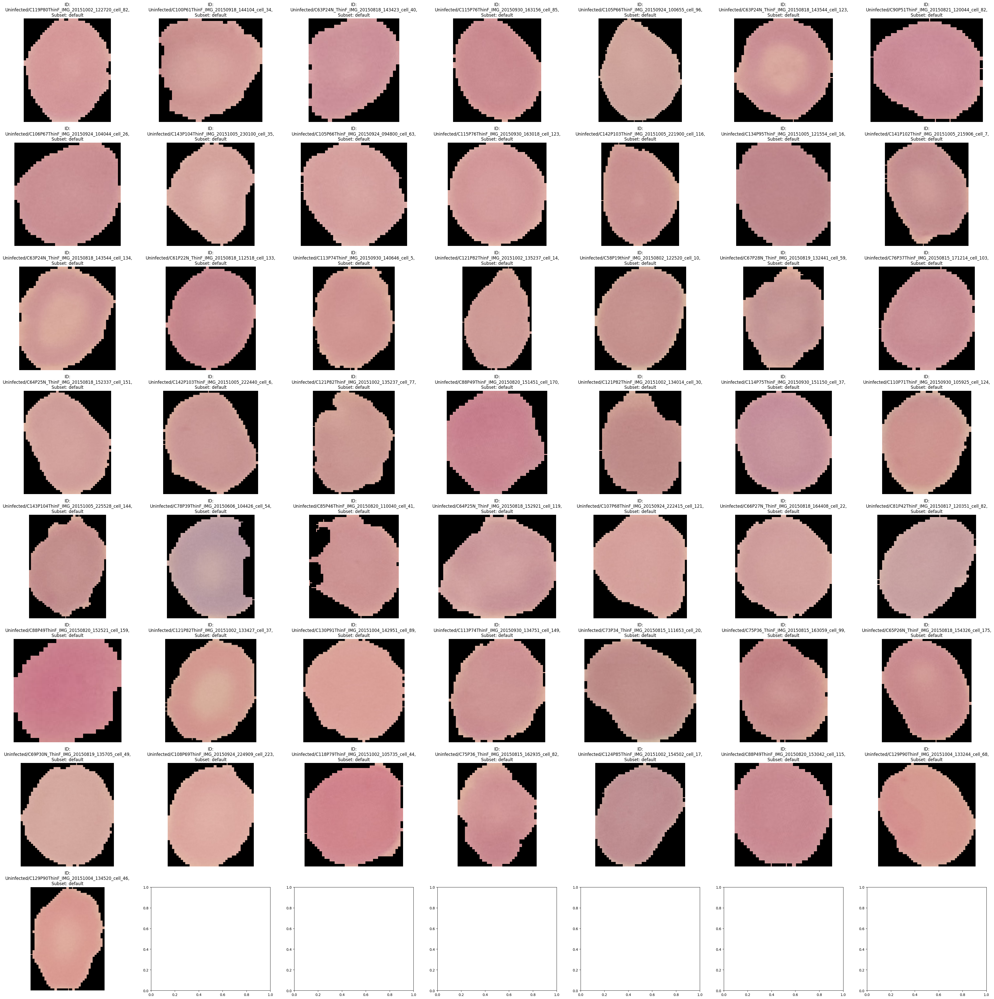

In [6]:
start_time = time.time()
topk_list = malaria_searcher.search_topk(query, topk=50)
print('search time for top50: ', time.time()-start_time)

subset_list = []
id_list =[]
for result in topk_list:
    subset_list.append(result.subset)
    id_list.append(result.id)
fig = malaria_visualizer.vis_gallery(id_list, subset_list, (None, None))
fig.show()

### Search result with `text` query

search time for top50:  0.6706809997558594


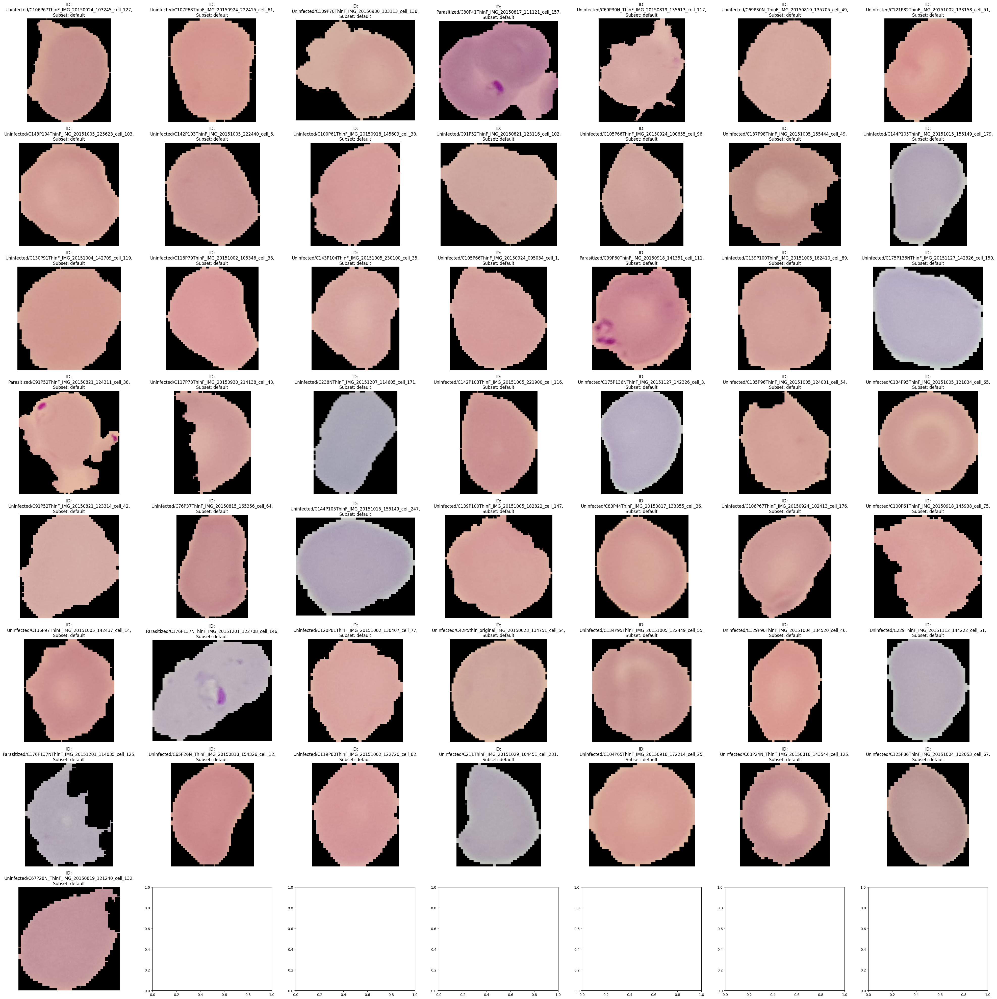

In [8]:
start_time = time.time()
topk_list = malaria_searcher.search_topk("Parasitized", topk=50)
print('search time for top50: ', time.time()-start_time)

subset_list = []
id_list =[]
for result in topk_list:
    subset_list.append(result.subset)
    id_list.append(result.id)
fig = malaria_visualizer.vis_gallery(id_list, subset_list, (None, None))
fig.show()

search time for top50:  0.18463683128356934


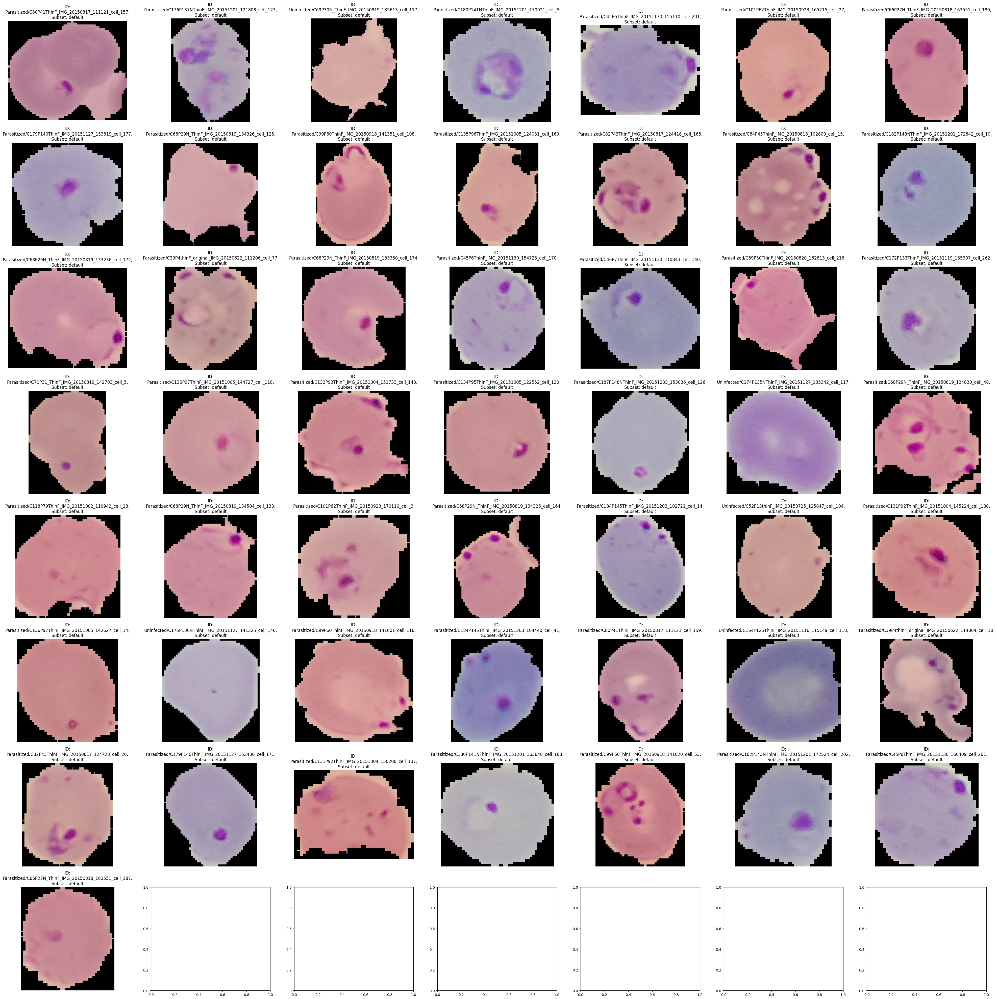

In [9]:
start_time = time.time()
topk_list = malaria_searcher.search_topk("Uninfected", topk=50)
print('search time for top50: ', time.time()-start_time)

subset_list = []
id_list =[]
for result in topk_list:
    subset_list.append(result.subset)
    id_list.append(result.id)
fig = malaria_visualizer.vis_gallery(id_list, subset_list, (None, None))
fig.show()